In [ ]:
%VIRTUAL_ENV%

In [67]:
import pandas as pd
import re
import os
import numpy as np
import shutil
import matplotlib.pyplot as plt
import ast
import os
import torch
import cv2

from PIL import Image, ImageDraw
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
tqdm.pandas()

In [68]:
os.getcwd()

'/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva'

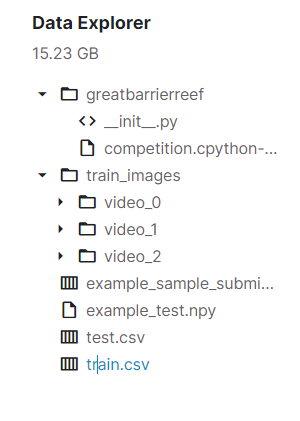

# 0. EDA

In [69]:
path = '/home/projects/competitions/cv/kaggle_great_barrier_reef/raw_data/example_sample_submission.csv'
df = pd.read_csv(path)
df

,row_num,annotations
0,0,0.99 123 456 1 1
1,1,0.99 123 456 1 1
2,2,0.99 123 456 1 1


In [70]:
path = '/home/projects/competitions/cv/kaggle_great_barrier_reef/raw_data/train.csv'
df = pd.read_csv(path)
df_init = df

- video_id - ID number of the video the image was part of. The video ids are not meaningfully ordered.
- video_frame - The frame number of the image within the video. Expect to see occasional gaps in the frame number from when the diver surfaced.
- sequence - ID of a gap-free subset of a given video. The sequence ids are not meaningfully ordered.
- sequence_frame - The frame number within a given sequence.
- image_id - ID code for the image, in the format '{video_id}-{video_frame}'
- annotations - The bounding boxes of any starfish detections in a string format that can be evaluated directly with Python. Does not use the same format as the predictions you will submit. Not available in test.csv. A bounding box is described by the pixel coordinate (x_min, y_min) of its upper left corner within the image together with its width and height in pixels.

In [71]:
df.head(30)

,video_id,sequence,video_frame,sequence_frame,image_id,annotations
0,0,40258,0,0,0-0,[]
1,0,40258,1,1,0-1,[]
2,0,40258,2,2,0-2,[]
3,0,40258,3,3,0-3,[]
4,0,40258,4,4,0-4,[]
5,0,40258,5,5,0-5,[]
6,0,40258,6,6,0-6,[]
7,0,40258,7,7,0-7,[]
8,0,40258,8,8,0-8,[]
9,0,40258,9,9,0-9,[]


In [72]:
df.image_id.unique().shape, df.video_id.unique().shape, df.video_frame.unique().shape

((23501,), (3,), (10688,))

In [73]:
# удалить картинки без бокса

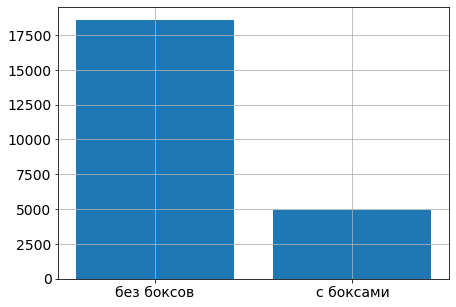

In [74]:
plt.figure(figsize = (7, 5))
plt.bar(['без боксов', 'с боксами'], (df[df.annotations == '[]'].shape[0], df[df.annotations != '[]'].shape[0]))
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.grid()
plt.show()

In [75]:
df[df.annotations == '[]'].shape[0], df[df.annotations != '[]'].shape[0]

(18582, 4919)

In [76]:
df_without_box= df[df.annotations == '[]']
df_without_box.shape
df_without_box

,video_id,sequence,video_frame,sequence_frame,image_id,annotations
0,0,40258,0,0,0-0,[]
1,0,40258,1,1,0-1,[]
2,0,40258,2,2,0-2,[]
3,0,40258,3,3,0-3,[]
4,0,40258,4,4,0-4,[]
...,...,...,...,...,...,...
23496,2,29859,10755,2983,2-10755,[]
23497,2,29859,10756,2984,2-10756,[]
23498,2,29859,10757,2985,2-10757,[]
23499,2,29859,10758,2986,2-10758,[]


In [77]:
df = df[df.annotations != '[]']
df.head()

,video_id,sequence,video_frame,sequence_frame,image_id,annotations
16,0,40258,16,16,0-16,"[{'x': 559, 'y': 213, 'width': 50, 'height': 32}]"
17,0,40258,17,17,0-17,"[{'x': 558, 'y': 213, 'width': 50, 'height': 32}]"
18,0,40258,18,18,0-18,"[{'x': 557, 'y': 213, 'width': 50, 'height': 32}]"
19,0,40258,19,19,0-19,"[{'x': 556, 'y': 214, 'width': 50, 'height': 32}]"
20,0,40258,20,20,0-20,"[{'x': 555, 'y': 214, 'width': 50, 'height': 32}]"


In [78]:
df['num_bboxs'] = df['annotations'].apply(ast.literal_eval).apply(lambda x : len(x))
df.head()

/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/kaggle_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,video_id,sequence,video_frame,sequence_frame,image_id,annotations,num_bboxs
16,0,40258,16,16,0-16,"[{'x': 559, 'y': 213, 'width': 50, 'height': 32}]",1
17,0,40258,17,17,0-17,"[{'x': 558, 'y': 213, 'width': 50, 'height': 32}]",1
18,0,40258,18,18,0-18,"[{'x': 557, 'y': 213, 'width': 50, 'height': 32}]",1
19,0,40258,19,19,0-19,"[{'x': 556, 'y': 214, 'width': 50, 'height': 32}]",1
20,0,40258,20,20,0-20,"[{'x': 555, 'y': 214, 'width': 50, 'height': 32}]",1


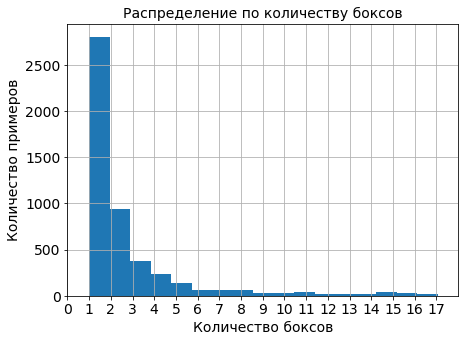

In [79]:
plt.figure(figsize = (7, 5))
df.num_bboxs.hist(bins = df.num_bboxs.max())
plt.title('Распределение по количеству боксов', fontsize = 14)
plt.xticks(np.arange(0, df.num_bboxs.max(), step=1), fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlim([0, df.num_bboxs.max()])
plt.xlabel('Количество боксов', fontsize = 14)
plt.ylabel('Количество примеров', fontsize = 14)
plt.show()

In [80]:
bbox_list = []

for bboxs in df['annotations'].apply(ast.literal_eval):
    for bbox in bboxs:
        bbox_list.append(bbox)
        
bbox_df = pd.DataFrame(bbox_list)
bbox_df['aspect_ratio'] = bbox_df['width'] / bbox_df['height']
bbox_df['area'] = bbox_df['width'] * bbox_df['height']
bbox_df.head()

,x,y,width,height,aspect_ratio,area
0,559,213,50,32,1.5625,1600
1,558,213,50,32,1.5625,1600
2,557,213,50,32,1.5625,1600
3,556,214,50,32,1.5625,1600
4,555,214,50,32,1.5625,1600


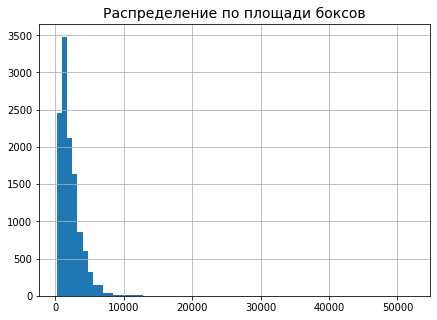

In [81]:
plt.figure(figsize = (7, 5))
plt.title('Распределение по площади боксов', fontsize = 14)
bbox_df.area.hist(bins = 70)
plt.show()

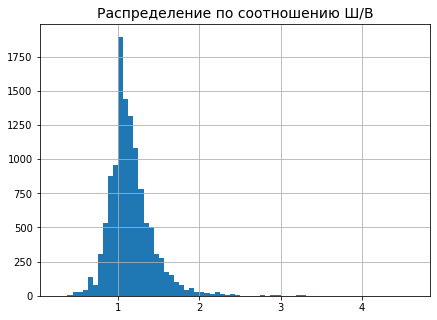

In [82]:
plt.figure(figsize = (7, 5))
plt.title('Распределение по соотношению Ш/В', fontsize = 14)
bbox_df.aspect_ratio.hist(bins = 70)
plt.show()

In [83]:
def image_with_box(video_id, video_frame):
    box = df_init[(df_init.video_id == video_id) & (df_init.video_frame == video_frame)].annotations.values[0]
    box = re.findall(r'[\d]+', box)
    box = [int(box_) for box_ in box]
    box = np.array(box).reshape(-1, 4)
    path_image = f'/home/projects/competitions/cv/kaggle_great_barrier_reef/raw_data/train_images/video_{video_id}/{video_frame}.jpg'
    image = Image.open(path_image)
    draw = ImageDraw.Draw(image)
    for box_ in box:
        draw.rectangle([(box_[0], box_[1]), ((box_[0] + box_[2]), (box_[1] + box_[3]))], outline ="yellow")
    return image
    

In [ ]:
image_with_box(video_id=0, video_frame=15)

In [ ]:
image_with_box(video_id=0, video_frame=16)

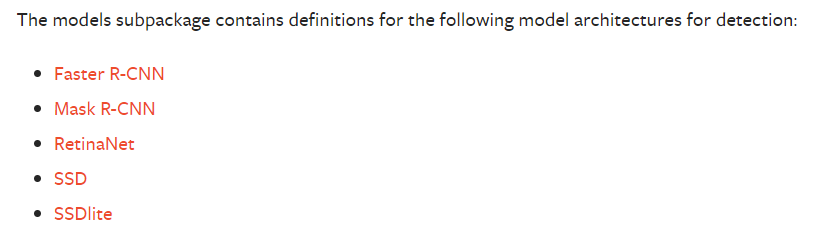

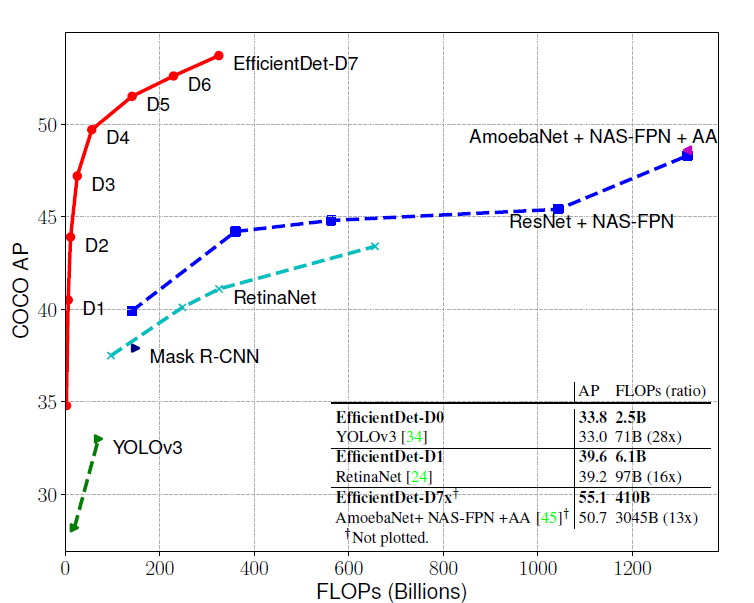

***YOLOv5 is a family of compound-scaled object detection models trained on the COCO dataset, and includes simple functionality for Test Time Augmentation (TTA), model ensembling, hyperparameter evolution, and export to ONNX, CoreML and TFLite.***

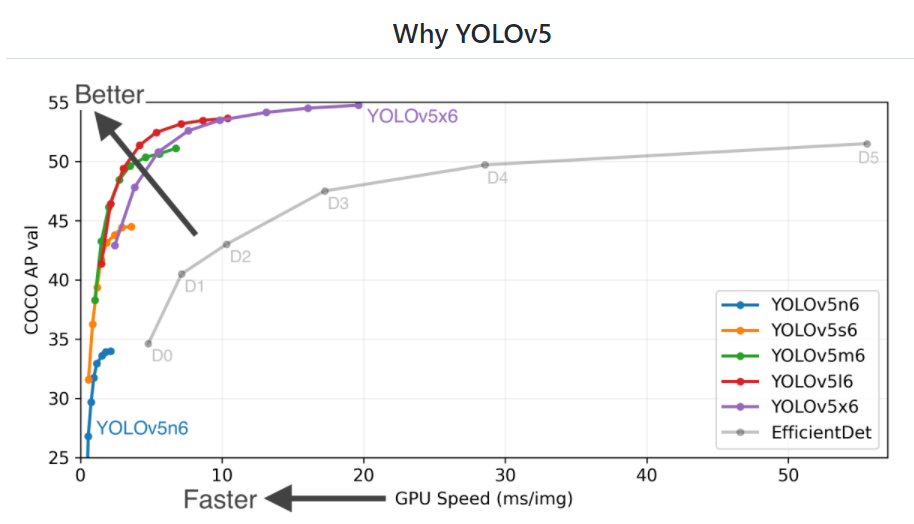

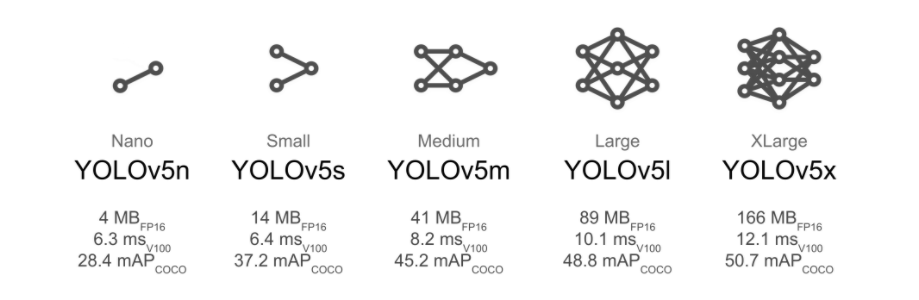

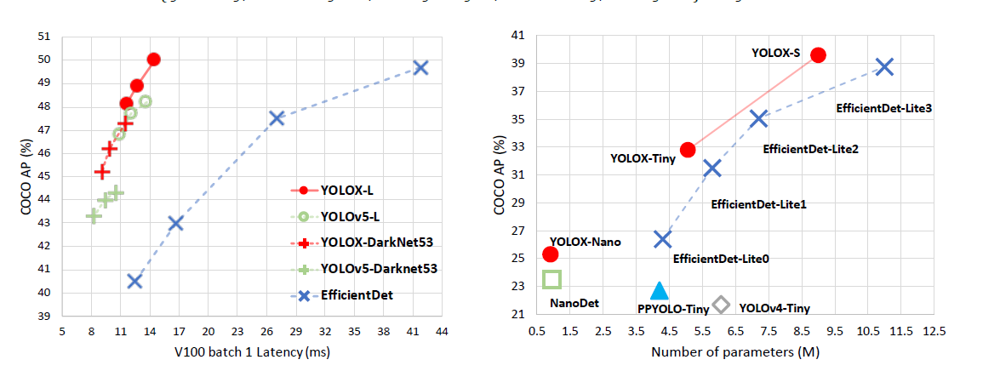

# 1. Create Dataset

## 1.1 Create dataset.yaml

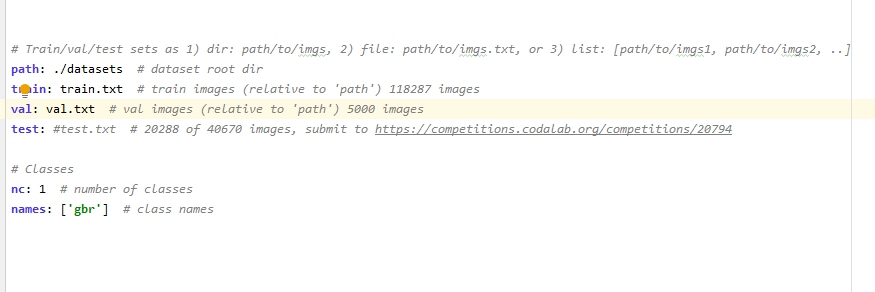


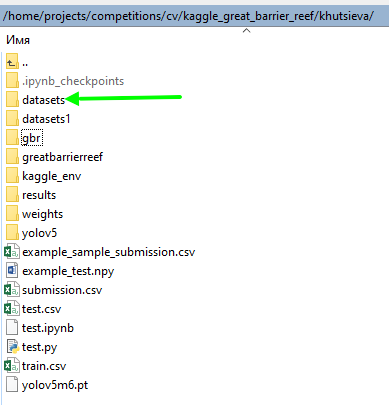

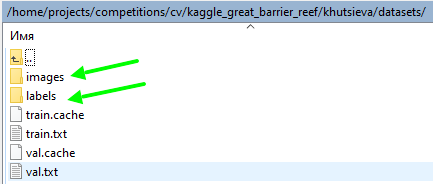

In [ ]:
directory = '/home/projects/competitions/cv/kaggle_great_barrier_reef/raw_data/train_images'

In [ ]:
LEN = 0
for directory_ in os.listdir(directory):
    LEN += len(os.listdir(f'{directory}/{directory_}'))
LEN

In [ ]:
path_to = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/datasets'

In [ ]:
images_path_to = f'{path_to}/images'

In [ ]:
# копирование изображений в image
i = 0
for image_id_ in df.image_id:
    i += 1
    print(i)
    shutil.copyfile(f'{directory}/video_{image_id_.split("-")[0]}/{image_id_.split("-")[1]}.jpg', 
                    f'{images_path_to}/{image_id_}.jpg')
    print(image_id_)

## 1.2 Create Labels

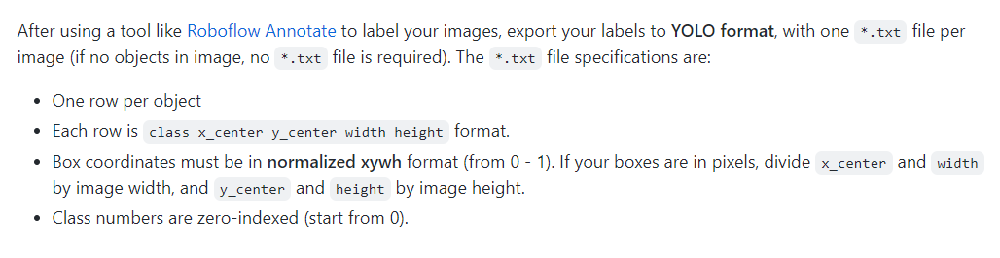

In [ ]:
labels_path_to = f'{path_to}/labels'

In [ ]:
height=720
width=1280
label = 0

def box_2_yolo_format(box, label):
    #[xmin, ymin, w, h]  => [xc, yc, w, h] (normalized)
    yolo_format = [int(label), (box[0] + box[2] / 2) / width, (box[1] + box[3] / 2) / height, box[2] / width, box[3] / height]
    yolo_format = [yolo_format_ if yolo_format_ <=1 else 1 for yolo_format_ in yolo_format ]
    return yolo_format

In [ ]:
bboxes = np.array([100, 200, 300, 400], dtype=np.float64)
box_2_yolo_format(bboxes, 0)

In [ ]:
bboxes = np.array([100, 200, 300, 400], dtype=np.float64)
bboxes[..., 2:4] += bboxes[..., 0:2]
print(bboxes)
bboxes[..., 0::2] = bboxes[..., 0::2].clip(0, width)
bboxes[..., 1::2] = bboxes[..., 1::2].clip(0, height)
print(bboxes)
bboxes[..., 0::2] /= int(width)
bboxes[..., 1::2] /= height
print(bboxes)
bboxes[..., 2] -= bboxes[..., 0]
bboxes[..., 3] -= bboxes[..., 1]
print(bboxes)
bboxes[..., 0] += bboxes[..., 2]/2
bboxes[..., 1] += bboxes[..., 3]/2
                        
bboxes

In [ ]:
df

In [ ]:
i = 0
for image_id_ in df.image_id:
    i += 1
    print(i)
    box = df[df.image_id == image_id_].annotations.values[0]
    box = re.findall(r'[\d]+', box)
    box = [int(box_) for box_ in box]
    box = np.array(box).reshape(-1, 4)
    box_new = []
    for box_ in box:
        box_new.append(box_2_yolo_format(box_, label))
    box_new_str = '\n'.join([' '.join(box_new_str_) for box_new_str_ in np.array(box_new).astype(str)]).replace('0.0 ', '0 ')
    with open(f'{labels_path_to}/{image_id_}.txt', 'w') as f:
        f.write(box_new_str)
    print(box_new_str)
    print(image_id_)



# 3. Train

In [ ]:
# разделение на train / val

In [ ]:
X_train, X_val = train_test_split(df.image_id.values, test_size=0.33, random_state=42)
X_train.shape, X_val.shape

In [ ]:
with open(os.path.join(path_to , 'train.txt'), 'w') as f:
    for path in X_train:
        f.write(f'{images_path_to}/{path}.jpg\n')
        
with open(os.path.join(path_to , 'val.txt'), 'w') as f:
    for path in X_val:
        f.write(f'{images_path_to}/{path}.jpg\n')

In [ ]:
'yolov5s6', 'yolov5m6'

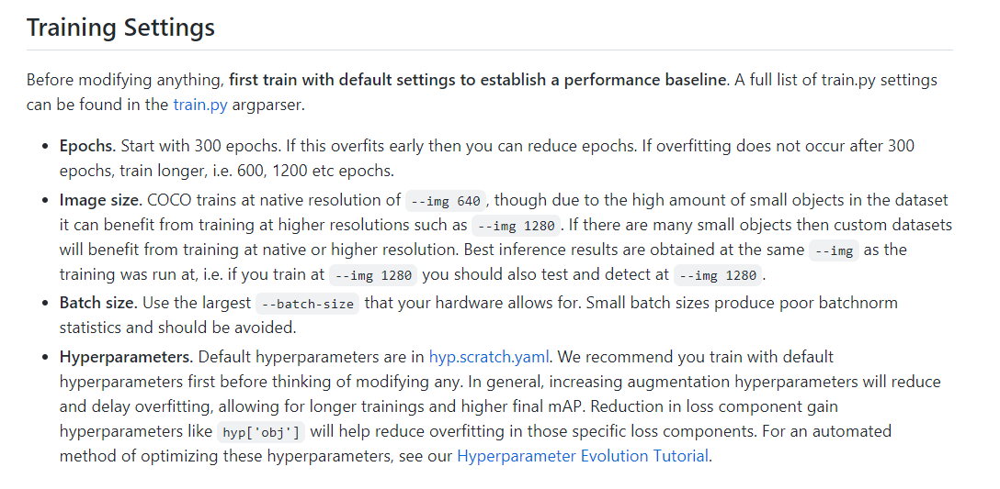

In [ ]:
--img 9000 
--batch 4 
--epochs 200 
--data gbr/gbr.yaml 
--hyp gbr/hyp_param.yaml 
--weights yolov5m6.pt 
--project results 
--name yolov5m6

In [ ]:
!python yolov5/train.py --img 9000 --batch 4 --epochs 200 --data gbr/gbr.yaml --hyp gbr/hyp_param.yaml --weights yolov5m6.pt --project results --name yolov5m6

# 4. Inference

In [ ]:
import torch
import cv2
import pandas as pd

from PIL import Image, ImageDraw
from tqdm.notebook import tqdm
tqdm.pandas()

In [84]:
#ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/results/yolov5m6/weights/best.pt'
#IMG_SIZE  = 2000
#ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/results/yolov5m62/weights/best.pt'
#IMG_SIZE  = 2000
#ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/weights/best_infer1.pt'
#IMG_SIZE  = 9000
#ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/results/yolov5s615/weights/best.pt'
#IMG_SIZE  = 4000

ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/results/yolov5s6/weights/best.pt'

IMG_SIZE  = 4000
CONF      = 0.25 #0.25 
IOU       = 0.4 #0.4
AUGMENT   = True

def load_model(ckpt_path, conf, iou):
    model = torch.hub.load('/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/yolov5',
                           'custom',
                           path=ckpt_path,
                           source='local',
                           force_reload=True)  # local repo
    model.conf = conf  # NMS confidence threshold
    model.iou  = iou  # NMS IoU threshold
    model.classes = None   # (optional list) filter by class, i.e. = [0, 15, 16] for persons, cats and dogs
    model.multi_label = False  # NMS multiple labels per box
    model.max_det = 1000  # maximum number of detections per image
    return model

def predict(model, img, size, augment=False):
    height, width = img.shape[:2]
    results = model(img, size=size, augment=augment)  # custom inference size
    preds   = results.pandas().xyxy[0]
    bboxes  = preds[['xmin','ymin','xmax','ymax']].values
    if len(bboxes):
        confs   = preds.confidence.values
        return bboxes, confs
    else:
        return [],[]

In [85]:
model = load_model(ckpt, conf=CONF, iou=IOU)

YOLOv5 🚀 2022-1-24 torch 1.10.1+cu102 CUDA:0 (Tesla V100-SXM2-32GB, 32510MiB)

Fusing layers... 
Model Summary: 280 layers, 12308200 parameters, 0 gradients
Adding AutoShape... 


In [86]:
image_path = '/home/projects/competitions/cv/kaggle_great_barrier_reef/raw_data/train_images/video_1/8849.jpg' # 948

In [87]:
img = cv2.imread(image_path)[...,::-1]
bboxes, confis = predict(model, img, size=IMG_SIZE, augment=AUGMENT)
print(bboxes)
print(confis)
image = Image.open(image_path)
draw = ImageDraw.Draw(image)
for box_ in bboxes:
    draw.rectangle([(box_[0], box_[1]), (box_[2], box_[3])], outline ="yellow")

[[     506.99      353.63      579.32      419.58]
 [     701.45      407.05      755.77      459.08]
 [     663.11      122.57      693.55      154.53]]
[    0.78519     0.74503     0.59498]


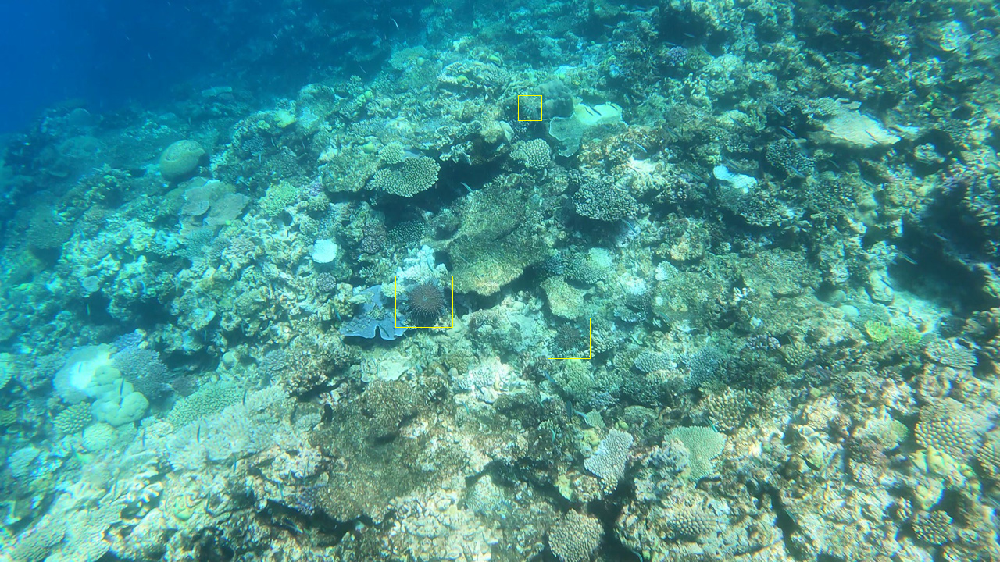

In [88]:
image

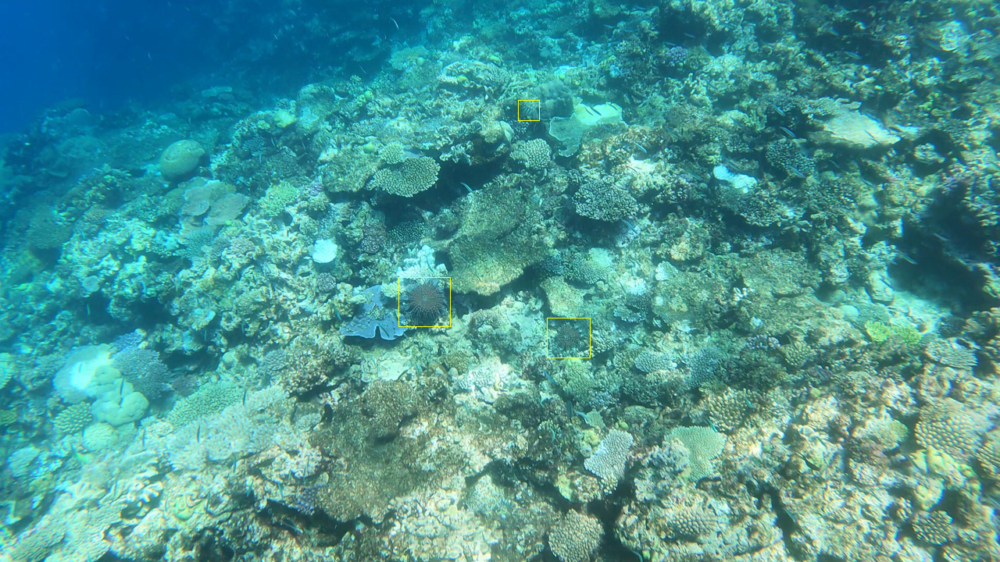

In [89]:
image_with_box(video_id=1, video_frame=8849) # 948, 949

# Увеличение выборки

In [ ]:
CONF      = 0.25 #0.25 
IOU       = 0.4 #0.4
model = load_model(ckpt, conf=CONF, iou=IOU)

In [ ]:
#делаем инференс на всех картинках, где нет боксов

In [ ]:
df_without_box.image_id[256]

In [ ]:
bboxes_witout_box = []
for idx, image_id_ in enumerate(df_without_box.image_id):
    print(idx)
    image_path = f'/home/projects/competitions/cv/kaggle_great_barrier_reef/raw_data/train_images/video_{image_id_.split("-")[0]}/{image_id_.split("-")[-1]}.jpg'
    img = cv2.imread(image_path)[...,::-1]
    bboxes, confis = predict(model, img, size=IMG_SIZE, augment=AUGMENT)
    print(bboxes)
    bboxes_witout_box.append(bboxes)

In [ ]:
df1 = pd.DataFrame()
df1['1'] = bboxes_witout_box
df1

In [ ]:
df_without_box = df_without_box.reset_index(drop=True)
df_without_box

In [ ]:
df_without_box['annotations_new'] = df1['1'].values
df_without_box.annotations_new = df_without_box.annotations_new.apply(lambda x: str(x))
sum(df_without_box.annotations_new != '[]')

In [ ]:
df_with_box_new = df_without_box[df_without_box.annotations_new != '[]']
df_with_box_new

In [ ]:
directory = '/home/projects/competitions/cv/kaggle_great_barrier_reef/raw_data/train_images'
path_to = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/datasets1'
images_path_to = f'{path_to}/images'
labels_path_to = f'{path_to}/labels'

In [ ]:
# копирование изображений в images
i = 0
for image_id_ in df.image_id:
    i += 1
    print(i)
    shutil.copyfile(f'{directory}/video_{image_id_.split("-")[0]}/{image_id_.split("-")[1]}.jpg', 
                    f'{images_path_to}/{image_id_}.jpg')
    print(image_id_)

i = 0
for image_id_ in df_with_box_new.image_id:
    i += 1
    print(i)
    shutil.copyfile(f'{directory}/video_{image_id_.split("-")[0]}/{image_id_.split("-")[1]}.jpg', 
                    f'{images_path_to}/{image_id_}.jpg')
    print(image_id_)    

In [ ]:
# создание txt в labels
i = 0
for image_id_ in df.image_id:
    i += 1
    print(i)
    box = df[df.image_id == image_id_].annotations.values[0]
    box = re.findall(r'[\d]+', box)
    box = [int(box_) for box_ in box]
    box = np.array(box).reshape(-1, 4)
    box_new = []
    for box_ in box:
        box_new.append(box_2_yolo_format(box_, label))
    box_new_str = '\n'.join([' '.join(box_new_str_) for box_new_str_ in np.array(box_new).astype(str)]).replace('0.0 ', '0 ')
    with open(f'{labels_path_to}/{image_id_}.txt', 'w') as f:
        f.write(box_new_str)
    print(box_new_str)
    print(image_id_)

i = 0
for image_id_ in df_with_box_new.image_id:
    i += 1
    print(i)
    box = df_with_box_new[df_with_box_new.image_id == image_id_].annotations_new.values[0]
    box = re.findall(r'[\d|.]+', box)
    box = [float(box_) for box_ in box]
    box = np.array(box).reshape(-1, 4)
    box_new = []
    for box_ in box:
        box_new.append(box_2_yolo_format(box_, label))
    box_new_str = '\n'.join([' '.join(box_new_str_) for box_new_str_ in np.array(box_new).astype(str)]).replace('0.0 ', '0 ')
    print(box_new_str)
    with open(f'{labels_path_to}/{image_id_}.txt', 'w') as f:
        f.write(box_new_str)
    print(box_new_str)
    print(image_id_)

In [ ]:
images_all = np.hstack([df.image_id.values, df_with_box_new.image_id.values])

In [ ]:
'2-95' in images_all

In [ ]:
images_path_to

In [ ]:
images_all = []
for image in os.listdir(images_path_to):
    images_all.append(image[:-4])
len(images_all)

In [ ]:
X_train, X_val = train_test_split(images_all, test_size=0.33, random_state=42)
len(X_train), len(X_val)

In [ ]:
with open(os.path.join(path_to , 'train1.txt'), 'w') as f:
    for path in X_train:
        f.write(f'{images_path_to}/{path}.jpg\n')
        
with open(os.path.join(path_to , 'val1.txt'), 'w') as f:
    for path in X_val:
        f.write(f'{images_path_to}/{path}.jpg\n')

In [ ]:
!python yolov5/train.py --img 2000 --batch 4 --epochs 200 --data gbr/gbr.yaml --hyp gbr/hyp_param.yaml --weights yolov5m6.pt --project results --name yolov5m6_new

# 5. Test

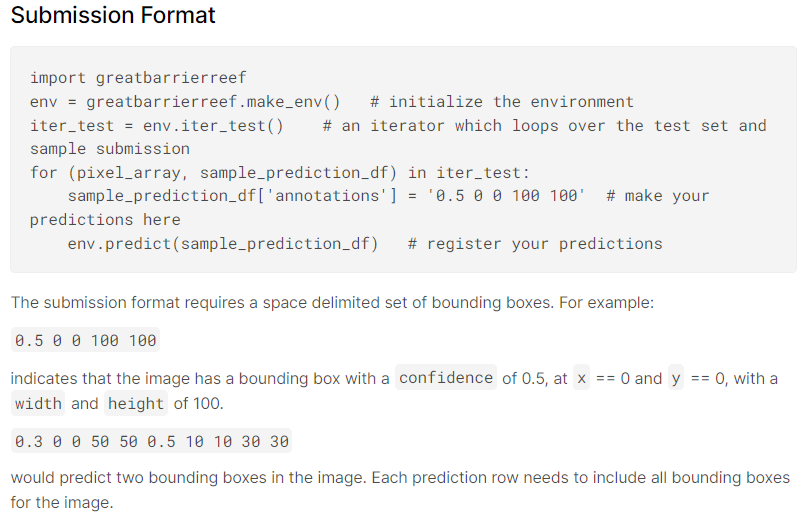

In [1]:
import torch
import cv2
import pandas as pd
import numpy as np

from PIL import Image, ImageDraw
from tqdm.notebook import tqdm
tqdm.pandas()

In [2]:
#ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/results/yolov5m6/weights/best.pt'
#IMG_SIZE  = 2000
#ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/results/yolov5m62/weights/best.pt'
#IMG_SIZE  = 2000
#ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/weights/best_infer1.pt'
#IMG_SIZE  = 9000
#ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/results/yolov5s615/weights/best.pt'
#IMG_SIZE  = 4000

ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/weights/best_s6_20.pt'

IMG_SIZE  = 7000
CONF      = 0.004 #0.25 
IOU       = 0.4 #0.4
AUGMENT   = True

def load_model(ckpt_path, conf, iou):
    model = torch.hub.load('/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/yolov5',
                           'custom',
                           path=ckpt_path,
                           source='local',
                           force_reload=True)  # local repo
    model.conf = conf  # NMS confidence threshold
    model.iou  = iou  # NMS IoU threshold
    model.classes = None   # (optional list) filter by class, i.e. = [0, 15, 16] for persons, cats and dogs
    model.multi_label = False  # NMS multiple labels per box
    model.max_det = 1000  # maximum number of detections per image
    return model

def predict(model, img, size, augment=False):
    height, width = img.shape[:2]
    results = model(img, size=size, augment=augment)  # custom inference size
    preds   = results.pandas().xyxy[0]
    bboxes  = preds[['xmin','ymin','xmax','ymax']].values
    if len(bboxes):
        confs   = preds.confidence.values
        return bboxes, confs
    else:
        return [],[]

In [3]:
model = load_model(ckpt, conf=CONF, iou=IOU)

YOLOv5 🚀 2022-1-24 torch 1.10.1+cu102 CUDA:0 (Tesla V100-SXM2-32GB, 32510MiB)

Fusing layers... 
Model Summary: 280 layers, 12308200 parameters, 0 gradients
Adding AutoShape... 


In [4]:
def format_prediction(bboxes, confs):
    annot = ''
    if len(bboxes)>0:
        for idx in range(len(bboxes)):
            xmin, ymin, xmax, ymax = bboxes[idx]
            w = xmax - xmin
            h = ymax - ymin
            conf             = confs[idx]
            annot += f'{conf} {xmin} {ymin} {w} {h}'
            annot +=' '
        annot = annot.strip(' ')
    return annot

In [5]:
from norfair import Detection, Tracker

def to_norfair(detects, frame_id):
    result = []
    for x_min, y_min, x_max, y_max, score in detects:
        xc, yc = (x_min + x_max) / 2, (y_min + y_max) / 2
        w, h = x_max - x_min, y_max - y_min
        result.append(Detection(points=np.array([xc, yc]), scores=np.array([score]), data=np.array([w, h, frame_id])))
        
    return result

def euclidean_distance(detection, tracked_object):
    return np.linalg.norm(detection.points - tracked_object.estimate)

tracker = Tracker(
    distance_function=euclidean_distance, 
    distance_threshold=30,
    hit_inertia_min=3,
    hit_inertia_max=6,
    initialization_delay=1,
)

In [6]:
def tracking_function(tracker, frame_id, bboxes, scores):
    
    detects = []
    predictions = []
    bboxes_new = []
    
    if len(scores)>0:
        for i in range(len(bboxes)):
            box = bboxes[i]
            score = scores[i]
            x_min = box[0]
            y_min = box[1]
            bbox_width = box[2] - box[0]
            bbox_height = box[3] - box[1]
            detects.append([x_min, y_min, x_min+bbox_width, y_min+bbox_height, score])
            predictions.append(f'{score} {x_min} {y_min} {bbox_width} {bbox_height}')
            bboxes_new.append(bboxes[i])
#             print(predictions[:-1])
    # Update tracks using detects from current frame
    tracked_objects = tracker.update(detections=to_norfair(detects, frame_id))
    for tobj in tracked_objects:
        bbox_width, bbox_height, last_detected_frame_id = tobj.last_detection.data
        if last_detected_frame_id == frame_id:  # Skip objects that were detected on current frame
            continue
        # Add objects that have no detections on current frame to predictions
        xc, yc = tobj.estimate[0]
        x_min, y_min = xc - bbox_width / 2, yc - bbox_height / 2
        score = tobj.last_detection.scores[0]
        predictions.append(f'{score} {x_min} {y_min} {bbox_width} {bbox_height}')
        bboxes_new.append([x_min, y_min, x_min + bbox_width, y_min + bbox_height])
        
    prediction_str = ' '.join(predictions)
        
    return prediction_str, bboxes_new

In [7]:
import greatbarrierreef
env = greatbarrierreef.make_env()# initialize the environment
iter_test = env.iter_test()      # an iterator which loops over the test set and sample submission

0it [00:00, ?it/s]

This version of the API is not optimized and should not be used to estimate the runtime of your code on the hidden test set.
idx = 0
bboxes = [[     469.38      465.73      732.73         720]
 [     892.03      567.48      943.02      608.07]]
len(bboxes) = 2
confs.max() = 0.0044316621497273445
annot1 = 0.0044316621497273445 469.3798828125 465.72943115234375 263.349609375 254.27056884765625 0.004123670980334282 892.0288696289062 567.479248046875 50.98956298828125 40.59259033203125
bboxes_new = [array([     469.38,      465.73,      732.73,         720]), array([     892.03,      567.48,      943.02,      608.07])]
len(bboxes_new) = 2
annot2 = 0.0044316621497273445 469.3798828125 465.72943115234375 263.349609375 254.27056884765625 0.004123670980334282 892.0288696289062 567.479248046875 50.98956298828125 40.59259033203125


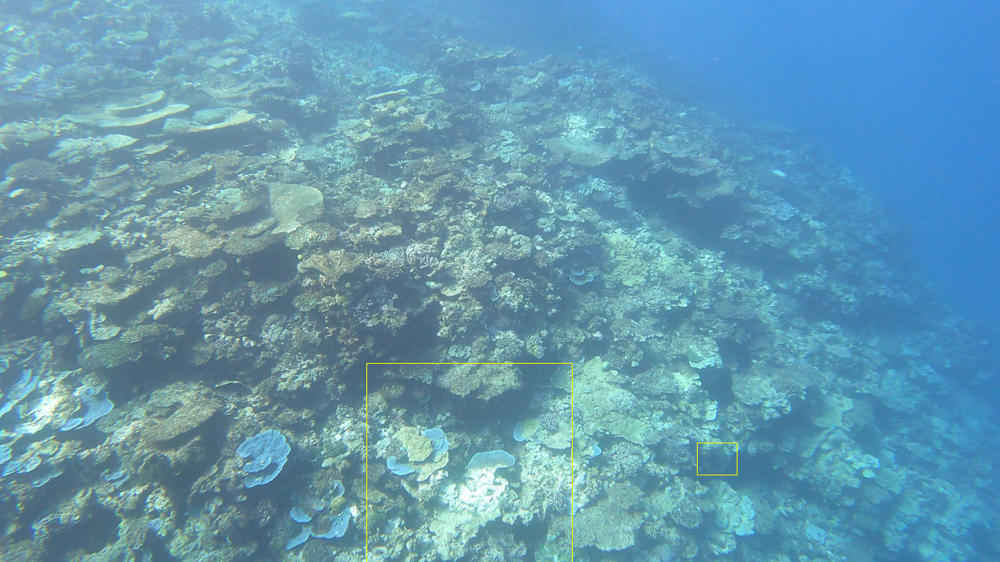

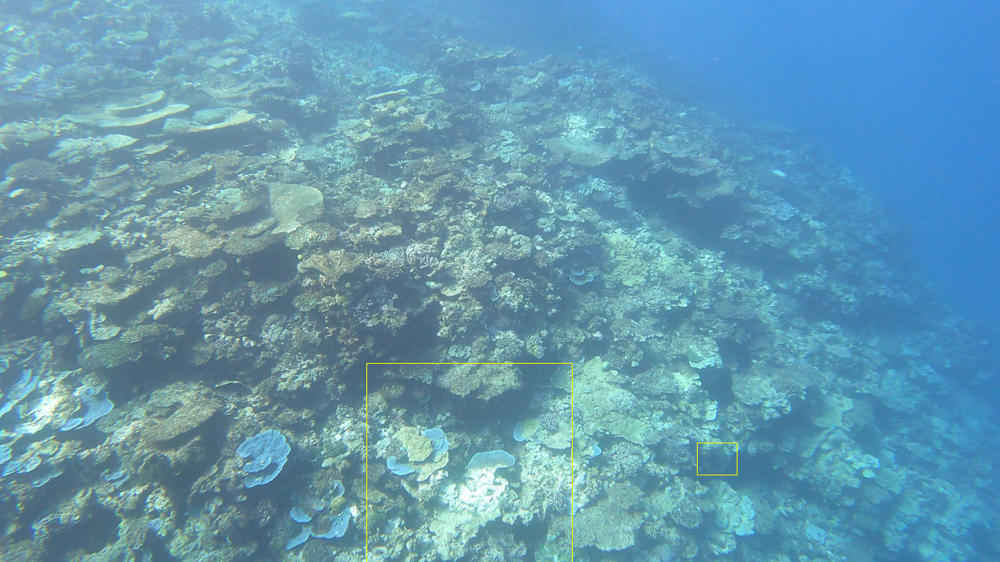

idx = 1
bboxes = [[     99.912      261.23      125.74      283.05]
 [      410.4      211.06      431.82       229.4]
 [     451.57      476.31      722.23         720]
 [    0.48557      688.12      42.653      719.65]]
len(bboxes) = 4
confs.max() = 0.0224621519446373
annot1 = 0.0224621519446373 99.91173553466797 261.22802734375 25.83136749267578 21.824615478515625 0.005650857463479042 410.402099609375 211.06068420410156 21.421234130859375 18.343536376953125 0.004344568587839603 451.5717468261719 476.31060791015625 270.6612243652344 243.68939208984375 0.004086810629814863 0.4855665862560272 688.1224365234375 42.16771557927132 31.5263671875
bboxes_new = [array([     99.912,      261.23,      125.74,      283.05]), array([      410.4,      211.06,      431.82,       229.4]), array([     451.57,      476.31,      722.23,         720]), array([    0.48557,      688.12,      42.653,      719.65])]
len(bboxes_new) = 4
annot2 = 0.0224621519446373 99.91173553466797 261.22802734375 25.8313674

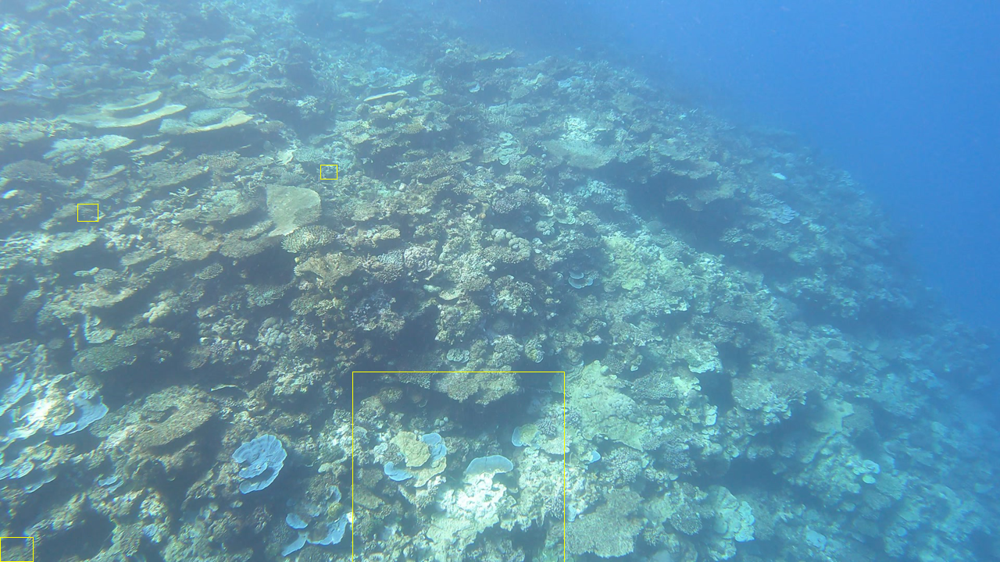

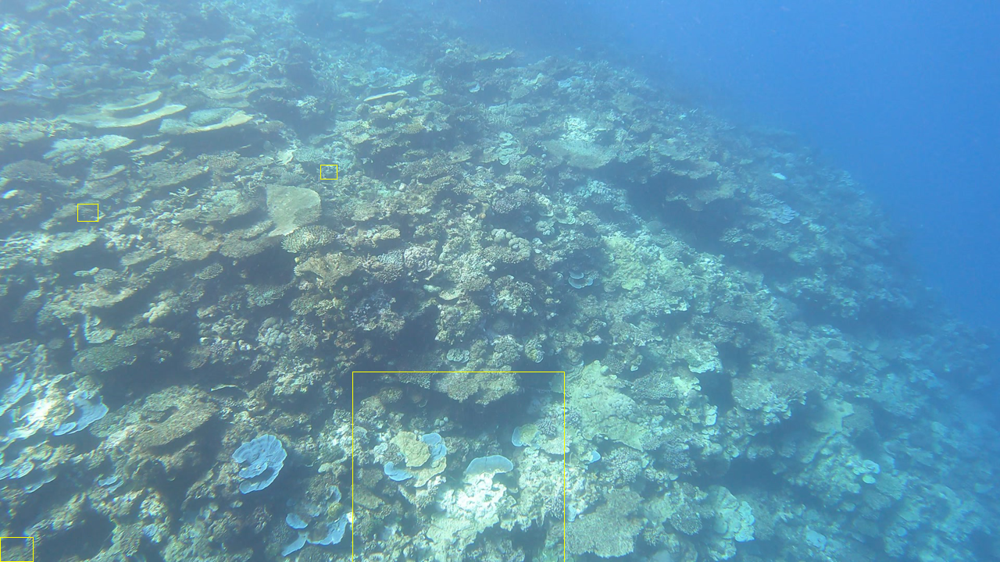

idx = 2
bboxes = [[     344.38       301.2      364.92      317.67]
 [     553.65      299.19      575.06      320.21]]
len(bboxes) = 2
confs.max() = 0.022741250693798065
annot1 = 0.022741250693798065 344.3845520019531 301.1959533691406 20.5400390625 16.474945068359375 0.005123595707118511 553.6466064453125 299.1901550292969 21.4139404296875 21.017486572265625
bboxes_new = [array([     344.38,       301.2,      364.92,      317.67]), array([     553.65,      299.19,      575.06,      320.21]), [455.1098289489746, 474.9879608154297, 725.771053314209, 718.6773529052734]]
len(bboxes_new) = 3
annot2 = 0.022741250693798065 344.3845520019531 301.1959533691406 20.5400390625 16.474945068359375 0.005123595707118511 553.6466064453125 299.1901550292969 21.4139404296875 21.017486572265625 0.004344568587839603 455.1098289489746 474.9879608154297 270.6612243652344 243.68939208984375


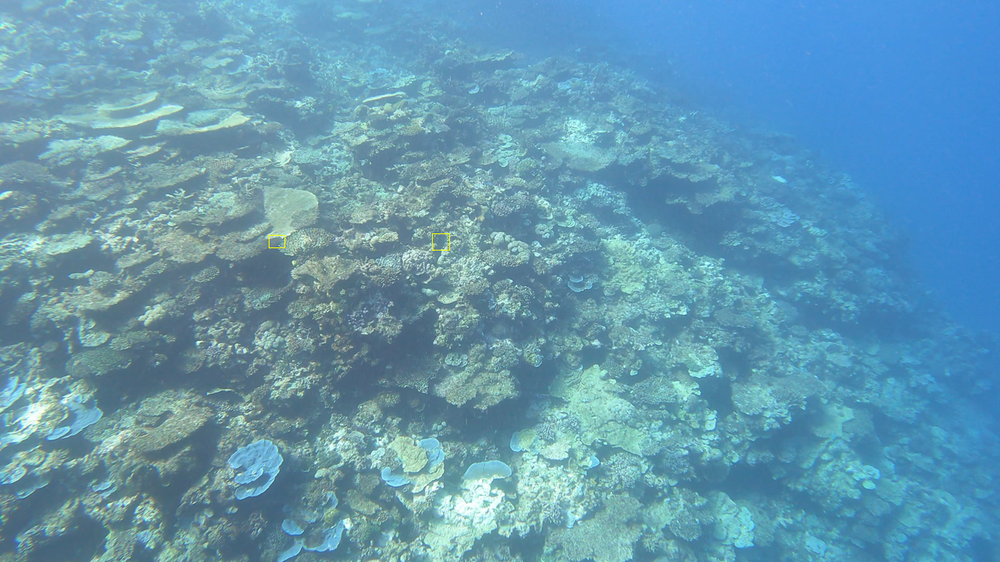

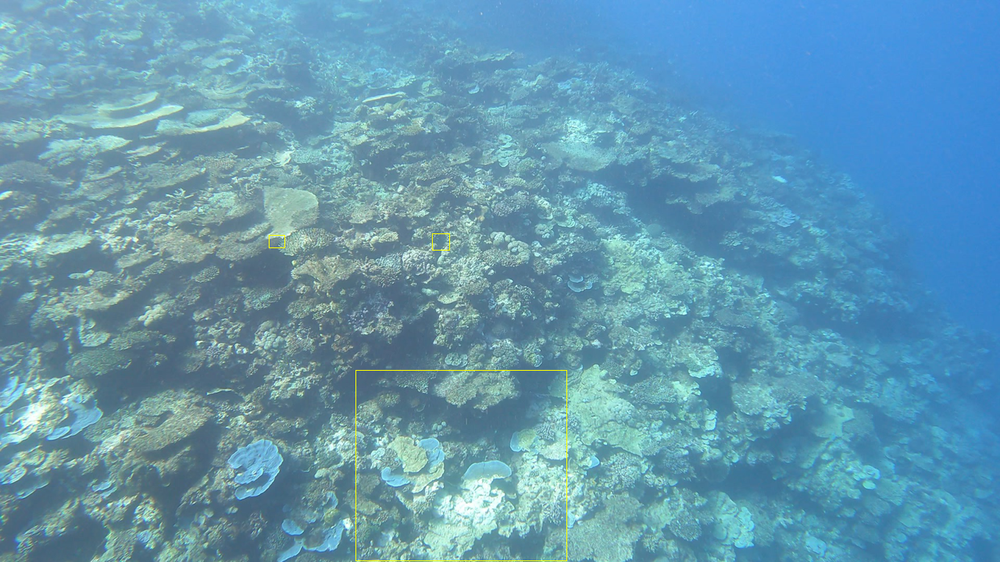

In [8]:
frame_id = 0
for idx, (img, pred_df) in enumerate(tqdm(iter_test)):
    print(f'idx = {idx}')
    bboxes, confs  = predict(model, img, size=IMG_SIZE, augment=AUGMENT)
    print(f'bboxes = {bboxes}')
    print(f'len(bboxes) = {len(bboxes)}')
    try:
        print(f'confs.max() = {confs.max()}')
    except:
        print('-')
    annot1 = format_prediction(bboxes, confs)
    print(f'annot1 = {annot}')
    annot2,  bboxes_new = tracking_function(tracker, frame_id, bboxes, confs)
    print(f'bboxes_new = {bboxes_new}')
    print(f'len(bboxes_new) = {len(bboxes_new)}')
    print(f'annot2 = {annot}')
    pred_df['annotations'] = annot2
    
    env.predict(pred_df)
    frame_id += 1
    
    image = Image.fromarray(img)
    draw = ImageDraw.Draw(image)
    for box_ in bboxes:
        draw.rectangle([(box_[0], box_[1]), (box_[2], box_[3])], outline ="yellow")
    display(image)
    
    image = Image.fromarray(img)
    draw = ImageDraw.Draw(image)
    for box_ in bboxes_new:
        draw.rectangle([(box_[0], box_[1]), (box_[2], box_[3])], outline ="yellow")
    display(image)

In [9]:
sub_df = pd.read_csv('submission.csv')
sub_df.head()

,index,annotations
0,0,0.0044316621497273445 469.3798828125 465.72943...
1,1,0.0224621519446373 99.91173553466797 261.22802...
2,2,0.022741250693798065 344.3845520019531 301.195...


# 6. Выбор conf

In [40]:
import pandas as pd
import torch
import re
import numpy as np
from tqdm.notebook import tqdm
tqdm.pandas()
import cv2

from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
%matplotlib inline

In [31]:
def load_model(ckpt_path, conf, iou):
    model = torch.hub.load('/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/yolov5',
                           'custom',
                           path=ckpt_path,
                           source='local',
                           force_reload=True)  # local repo
    model.conf = conf  # NMS confidence threshold
    model.iou  = iou  # NMS IoU threshold
    model.classes = None   # (optional list) filter by class, i.e. = [0, 15, 16] for persons, cats and dogs
    model.multi_label = False  # NMS multiple labels per box
    model.max_det = 1000  # maximum number of detections per image
    return model

def predict(model, img, size, augment=False):
    height, width = img.shape[:2]
    results = model(img, size=size, augment=augment)  # custom inference size
    preds   = results.pandas().xyxy[0]
    bboxes  = preds[['xmin','ymin','xmax','ymax']].values
    if len(bboxes):
        confs   = preds.confidence.values
        return bboxes, confs
    else:
        return [],[]

In [32]:
path = '/home/projects/competitions/cv/kaggle_great_barrier_reef/raw_data/train.csv'
path_to = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/datasets1'
images_path_to = f'{path_to}/images'

In [26]:
df = pd.read_csv(path)
df_init = df
df = df[df.annotations != '[]']

In [27]:
X_train, X_val = train_test_split(df.image_id.values, test_size=0.33, random_state=42)

In [94]:
#ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/weights/best_s615_44.pt'
#ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/results/yolov5s615/weights/best.pt'
ckpt = '/home/projects/competitions/cv/kaggle_great_barrier_reef/khutsieva/results/yolov5s6/weights/best.pt'
IMG_SIZE  = 4000
AUGMENT   = True

In [95]:
CONF = 0.25
IOU = 0.01

# Which IOU level to evaluate (Competition metric tests 0.3 to 0.8 with step of 0.05)
eval_IOU = 0.65


model = load_model(ckpt, conf=CONF, iou=IOU)

YOLOv5 🚀 2022-1-24 torch 1.10.1+cu102 CUDA:0 (Tesla V100-SXM2-32GB, 32510MiB)

Fusing layers... 
Model Summary: 280 layers, 12308200 parameters, 0 gradients
Adding AutoShape... 


In [96]:
image_paths = []
for path in X_val:
    image_paths.append(f'{images_path_to}/{path}.jpg')

In [97]:
gt = []
for x in X_val:
    box = df_init[(df_init.video_id == int(x.split('-')[0])) & (df_init.video_frame == int(x.split('-')[-1]))].annotations.values[0]
    box = re.findall(r'[\d]+', box)
    box = [int(box_) for box_ in box]
    box = np.array(box).reshape(-1, 4)
    gt.append(box.tolist())

In [98]:
len(gt), len(image_paths)

(1624, 1624)

In [99]:
def IOU_coco(bbox1, bbox2):
    '''
        adapted from https://stackoverflow.com/questions/25349178/calculating-percentage-of-bounding-box-overlap-for-image-detector-evaluation
    '''
    x_left = max(bbox1[0], bbox2[0])
    y_top = max(bbox1[1], bbox2[1])
    x_right = min(bbox1[0] + bbox1[2], bbox2[0] + bbox2[2])
    y_bottom = min(bbox1[1] + bbox1[3], bbox2[1] + bbox2[3])
    if x_right < x_left or y_bottom < y_top:
        return 0.0
    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    bb1_area = bbox1[2] * bbox1[3]
    bb2_area = bbox2[2] * bbox2[3]
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)

    assert iou >= 0.0
    assert iou <= 1.0
    return iou

# Confidence scores of true positives, false positives and count false negatives
TP = [] # Confidence scores of true positives
FP = [] # Confidence scores of true positives
FN = 0  # Count of false negative boxes

for i in tqdm(range(len(image_paths))):
    TEST_IMAGE_PATH = image_paths[i]
    img = cv2.imread(TEST_IMAGE_PATH)
    img = cv2.imread(TEST_IMAGE_PATH)[...,::-1]
    bboxes_, scores = predict(model, img, size=IMG_SIZE, augment=AUGMENT)
    
    bboxes = []
    for idx in range(len(bboxes_)):
        xmin, ymin, xmax, ymax = bboxes_[idx]
        w = xmax - xmin
        h = ymax - ymin
        bboxes.append([xmin, ymin, w, h])

    # Test YOLOV5
    gt0 = gt[i]
    if len(bboxes) == 0:
        # all gt are false negative
        FN += len(gt0)
    else:
        bb = bboxes.copy() #.tolist()
        for idx, b in enumerate(bb):
            b.append(scores[idx])
        bb.sort(key = lambda x: x[4], reverse = True)
        
        if len(gt0) == 0:
            # all bboxes are false positives
            for b in bb:
                FP.append(b[4])
        else:
            # match bbox with gt
            for b in bb:
                matched = False
                for g in gt0:
                    # check whether gt box is already matched to an inference bb
                    if len(g) == 4:
                        # g bbox is unmatched
                        if IOU_coco(b, g) >= eval_IOU:
                            g.append(b[4]) # assign confidence values to g; marks g as matched
                            matched = True
                            TP.append(b[4])
                            break
                if not matched:
                    FP.append(b[4])
            for g in gt0:
                if len(g) == 4:
                    FN += 1

  0%|          | 0/1624 [00:00<?, ?it/s]

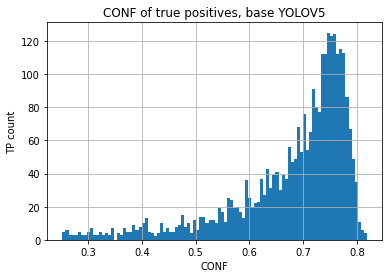

True positives = 2857
False negatives = 886


In [100]:
plt.hist(TP, 100)
plt.title("CONF of true positives, base YOLOV5")
plt.xlabel('CONF')
plt.ylabel('TP count')
plt.grid()
plt.show()

print(f'True positives = {len(TP)}')
print(f'False negatives = {FN}')

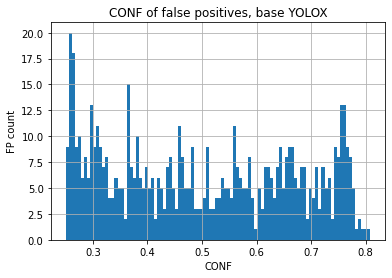

False positives = 632


In [101]:
plt.hist(FP, 100)
plt.title("CONF of false positives, base YOLOX")
plt.xlabel('CONF')
plt.ylabel('FP count')
plt.grid()
plt.show()

print(f'False positives = {len(FP)}')

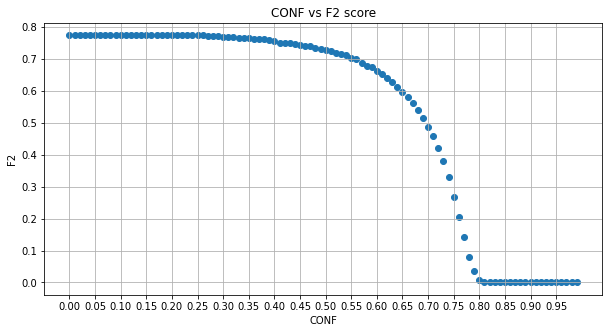

F2 max is 0.7737742224927071 at CONF = 0.0


In [102]:
F2list = []
F2max = 0.0
F2maxat = -1.0

for c in np.arange(0.0, 1.0, 0.01):
    FNcount = FN + sum(1 for i in TP if i < c)
    TPcount = sum(1 for i in TP if i >= c)
    FPcount = sum(1 for i in FP if i >= c)
    R = TPcount / (TPcount + FNcount + 0.0001)
    P = TPcount / (TPcount + FPcount + 0.0001)
    F2 = (5 * P * R) / (4 * P + R + 0.0001)
    F2list.append((c, F2))
    if F2max < F2:
        F2max = F2
        F2maxat = c

plt.figure(figsize=(10, 5))
plt.scatter(*zip(*F2list))
plt.title("CONF vs F2 score")
plt.xlabel('CONF')
plt.ylabel('F2')
plt.xticks(np.arange(0, 1, 0.05))
plt.grid()
plt.show()

print(f'F2 max is {F2max} at CONF = {F2maxat}')

# 7. Ссылки

ноутбуки:

https://www.kaggle.com/awsaf49/great-barrier-reef-yolov5-train/notebook#%E2%9A%99%EF%B8%8F-Configuration

https://www.kaggle.com/awsaf49/great-barrier-reef-yolov5-infer/data

https://www.kaggle.com/kocha1/only-yolov5-tracking-lb-642/notebook

https://www.kaggle.com/locbaop/systematic-evaluate-f2-yolov5/notebook

библиотеки:

https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data

https://docs.ultralytics.com/tutorials/pytorch-hub/

https://github.com/ultralytics/yolov5/releases

https://github.com/awsaf49/bbox

# 8. Разное

In [ ]:
image_path = '/home/projects/competitions/cv/kaggle_great_barrier_reef/raw_data/train_images/video_0/35.jpg'


In [ ]:
im = cv2.imread(image_path)  # BGR
im.shape

In [ ]:
h0, w0 = im.shape[:2]  # orig hw
h0, w0

In [ ]:
img_size = 8000

In [ ]:
r = img_size / max(h0, w0)  # ratio
r

In [ ]:
im_new = cv2.resize(im, (int(w0 * r), int(h0 * r)), interpolation=cv2.INTER_LINEAR)
im_new.shape

In [ ]:
Image.fromarray(cv2.cvtColor(im,cv2.COLOR_BGR2RGB))

In [ ]:
Image.fromarray(cv2.cvtColor(im_new,cv2.COLOR_BGR2RGB))

In [ ]:
Image.fromarray(im)